# Artifact detection and labeling of Sleep Data 

This script loads the pre-processed polysomnography data and utilizes a Riemanian geometry based algorithm to detect and label artifacts. The algorithm is based on the following papers: https://hal.archives-ouvertes.fr/hal-00781701 & https://hal.science/hal-02015909 and is implemented in the yasa toolbox. This so-called "Riemannian Potato" is a clustering method that iteratively estimates the centroid of clean signal by rejecting every trial that is too far from it, thus giving you a label for each given epoch.

In [1]:
%matplotlib inline

## Import packages 
import yasa
import numpy as np
import os
import mne
from tqdm import tqdm
mne.set_log_level('WARNING')

In [2]:
## 1. Load data
path = '/mnt/server/data03/2023_NENA_Aperiodic_Workshop/data/processed/'
fig_path = '/mnt/server/data03/2023_NENA_Aperiodic_Workshop/figures/'
# Obtain list of unique recordings
files = list(set(["-".join(f.split('-')[0:3]) for f in os.listdir(path)]))

  0%|          | 0/20 [00:00<?, ?it/s]

Detecting and labeling artifacts in file : cfs-visit5-801058


  5%|▌         | 1/20 [00:31<10:02, 31.69s/it]

Detecting and labeling artifacts in file : cfs-visit5-802298


 10%|█         | 2/20 [01:03<09:31, 31.73s/it]

Detecting and labeling artifacts in file : cfs-visit5-801126


23-Aug-23 17:07:48 | WARNING | Hypnogram is SHORTER than data by 2.00 seconds. Padding hypnogram with last value to match data.size.
 15%|█▌        | 3/20 [01:30<08:22, 29.54s/it]

Detecting and labeling artifacts in file : cfs-visit5-801416


23-Aug-23 17:08:18 | WARNING | Hypnogram is SHORTER than data by 2.00 seconds. Padding hypnogram with last value to match data.size.
 20%|██        | 4/20 [02:00<07:59, 29.95s/it]

Detecting and labeling artifacts in file : cfs-visit5-801393


23-Aug-23 17:08:48 | WARNING | Hypnogram is SHORTER than data by 2.00 seconds. Padding hypnogram with last value to match data.size.
 25%|██▌       | 5/20 [02:30<07:27, 29.81s/it]

Detecting and labeling artifacts in file : cfs-visit5-801907


23-Aug-23 17:09:17 | WARNING | Hypnogram is SHORTER than data by 2.00 seconds. Padding hypnogram with last value to match data.size.
 30%|███       | 6/20 [03:00<06:57, 29.82s/it]

Detecting and labeling artifacts in file : cfs-visit5-800407


23-Aug-23 17:09:47 | WARNING | Hypnogram is SHORTER than data by 2.00 seconds. Padding hypnogram with last value to match data.size.
 35%|███▌      | 7/20 [03:29<06:24, 29.58s/it]

Detecting and labeling artifacts in file : cfs-visit5-800630


23-Aug-23 17:10:20 | WARNING | Hypnogram is SHORTER than data by 2.00 seconds. Padding hypnogram with last value to match data.size.
 40%|████      | 8/20 [04:03<06:11, 30.96s/it]

Detecting and labeling artifacts in file : cfs-visit5-801152


23-Aug-23 17:10:52 | WARNING | Hypnogram is SHORTER than data by 2.00 seconds. Padding hypnogram with last value to match data.size.
 45%|████▌     | 9/20 [04:34<05:41, 31.07s/it]

Detecting and labeling artifacts in file : cfs-visit5-802643


23-Aug-23 17:11:25 | WARNING | Hypnogram is SHORTER than data by 2.00 seconds. Padding hypnogram with last value to match data.size.
 50%|█████     | 10/20 [05:07<05:16, 31.66s/it]

Detecting and labeling artifacts in file : cfs-visit5-801602


23-Aug-23 17:11:55 | WARNING | Hypnogram is SHORTER than data by 2.00 seconds. Padding hypnogram with last value to match data.size.
 55%|█████▌    | 11/20 [05:38<04:41, 31.30s/it]

Detecting and labeling artifacts in file : cfs-visit5-801747


23-Aug-23 17:12:27 | WARNING | Hypnogram is SHORTER than data by 2.00 seconds. Padding hypnogram with last value to match data.size.
 60%|██████    | 12/20 [06:10<04:12, 31.62s/it]

Detecting and labeling artifacts in file : cfs-visit5-800659


23-Aug-23 17:13:02 | WARNING | Hypnogram is SHORTER than data by 2.00 seconds. Padding hypnogram with last value to match data.size.
 65%|██████▌   | 13/20 [06:45<03:47, 32.55s/it]

Detecting and labeling artifacts in file : cfs-visit5-800092


23-Aug-23 17:13:35 | WARNING | Hypnogram is SHORTER than data by 2.00 seconds. Padding hypnogram with last value to match data.size.
 70%|███████   | 14/20 [07:17<03:15, 32.62s/it]

Detecting and labeling artifacts in file : cfs-visit5-801044


23-Aug-23 17:14:05 | WARNING | Hypnogram is SHORTER than data by 2.00 seconds. Padding hypnogram with last value to match data.size.
 75%|███████▌  | 15/20 [07:47<02:38, 31.79s/it]

Detecting and labeling artifacts in file : cfs-visit5-800697


 80%|████████  | 16/20 [08:20<02:08, 32.17s/it]

Detecting and labeling artifacts in file : cfs-visit5-800667


 85%|████████▌ | 17/20 [08:50<01:34, 31.54s/it]

Detecting and labeling artifacts in file : cfs-visit5-802132


 90%|█████████ | 18/20 [09:21<01:02, 31.18s/it]

Detecting and labeling artifacts in file : cfs-visit5-802522


 95%|█████████▌| 19/20 [09:47<00:29, 29.83s/it]

Detecting and labeling artifacts in file : cfs-visit5-800551


100%|██████████| 20/20 [10:18<00:00, 30.94s/it]


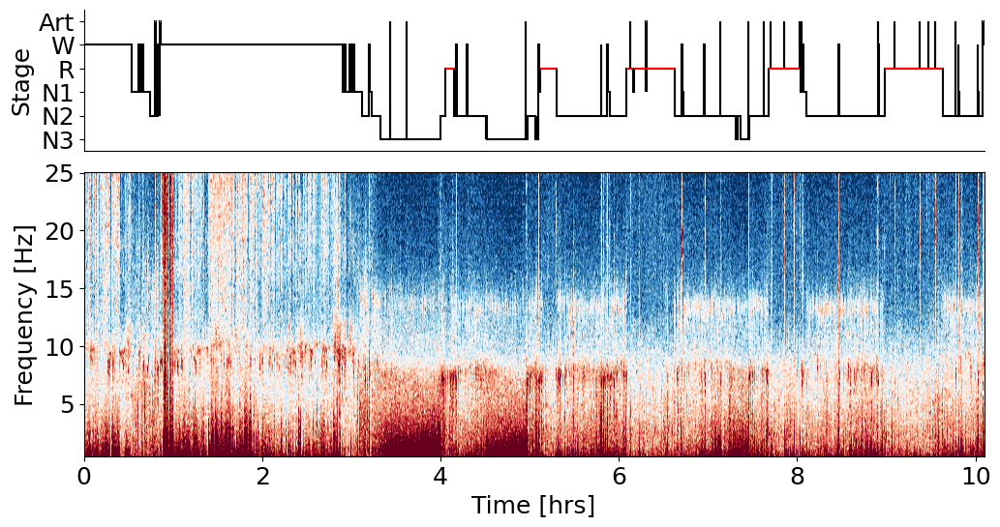

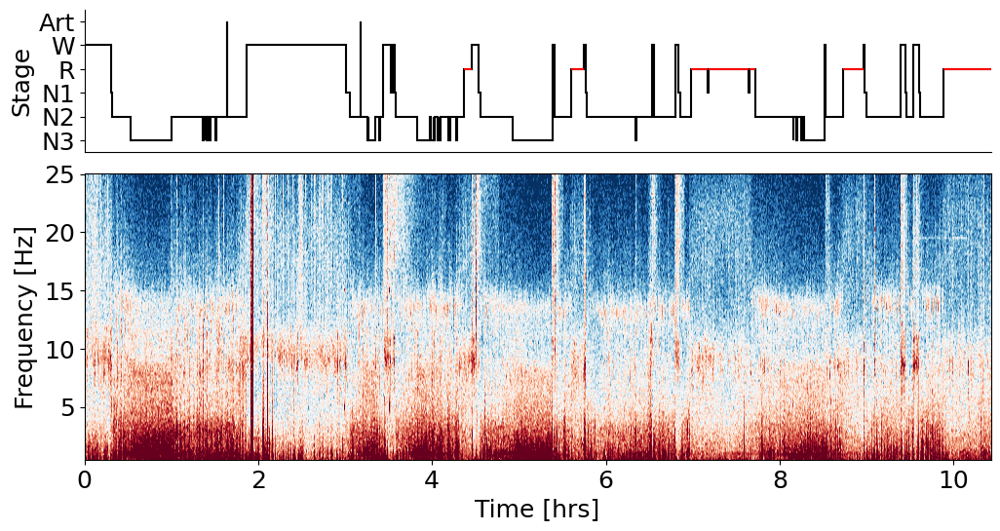

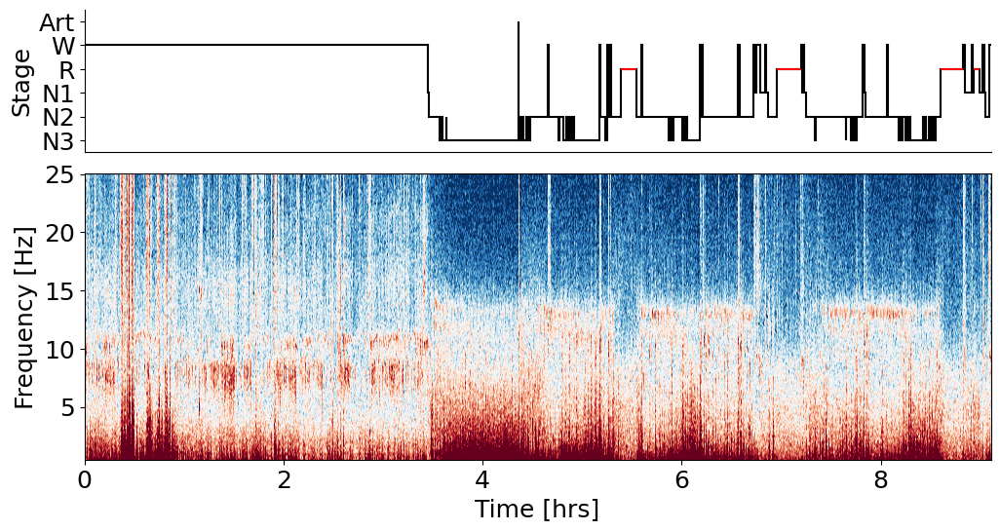

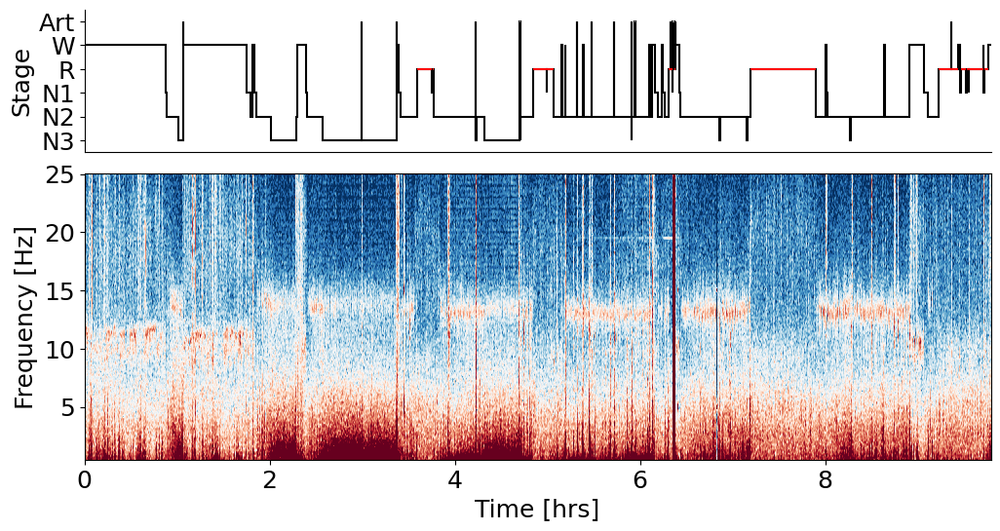

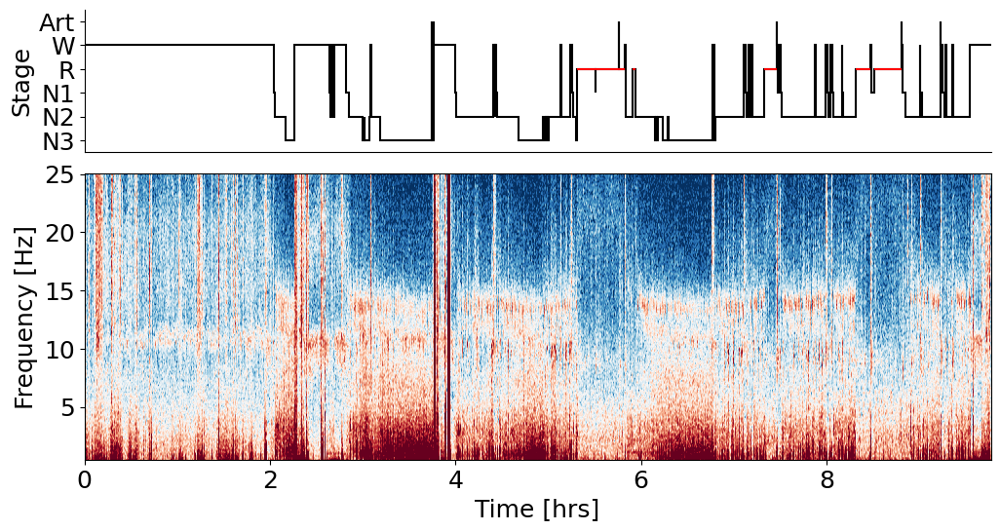

...

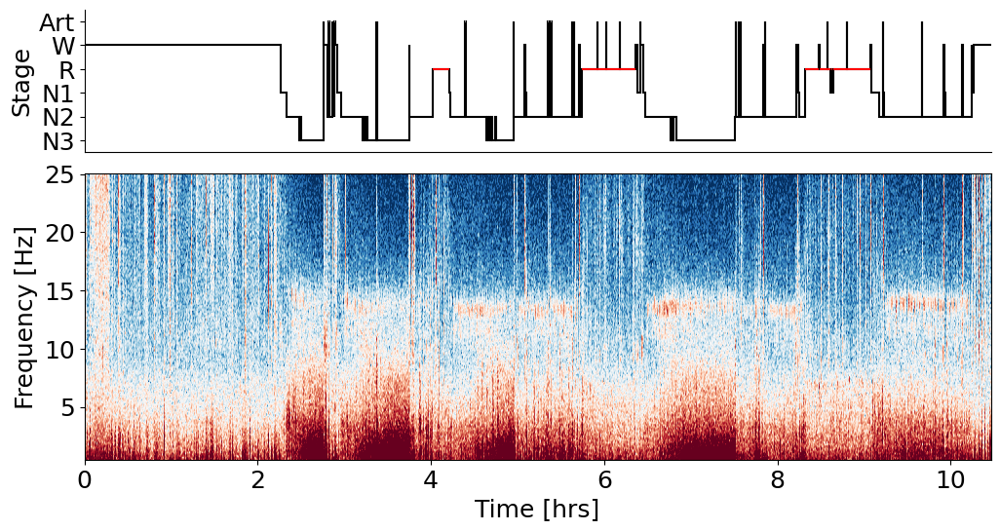

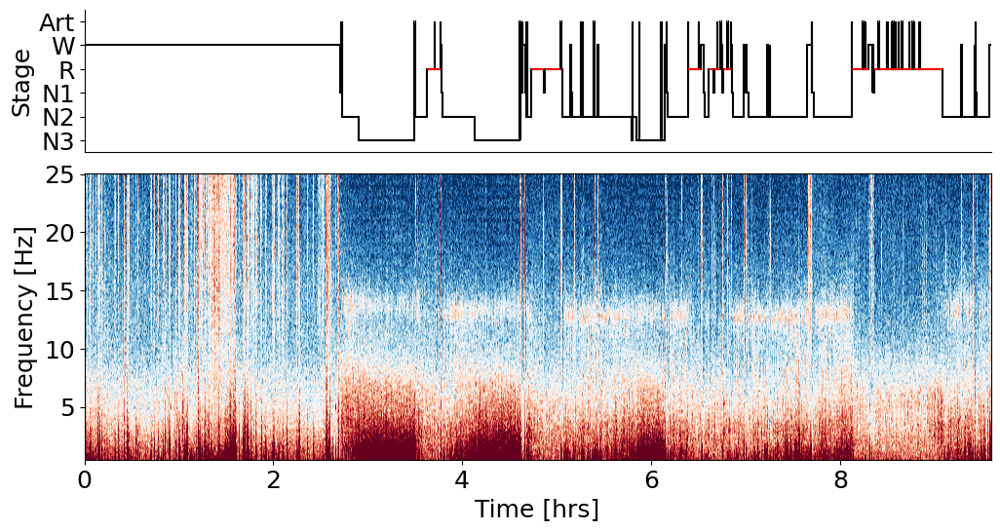

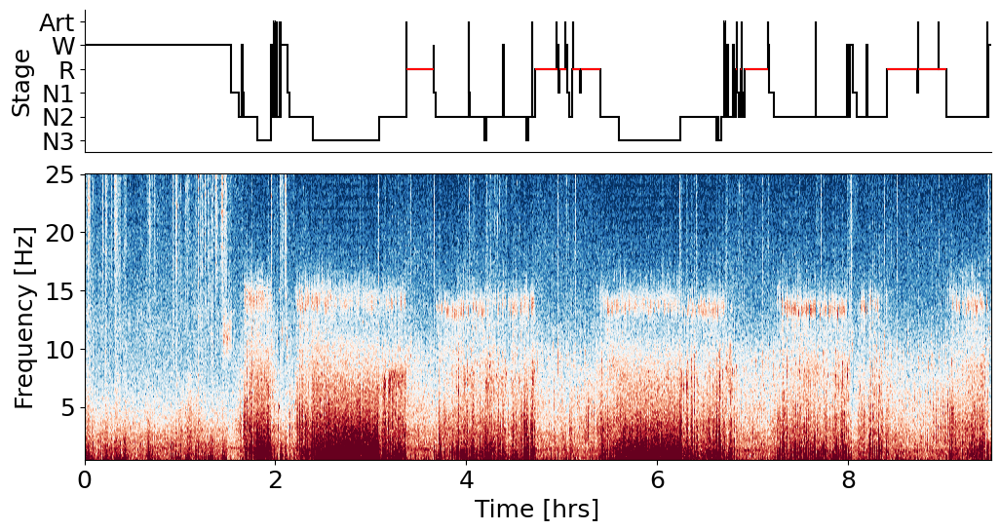

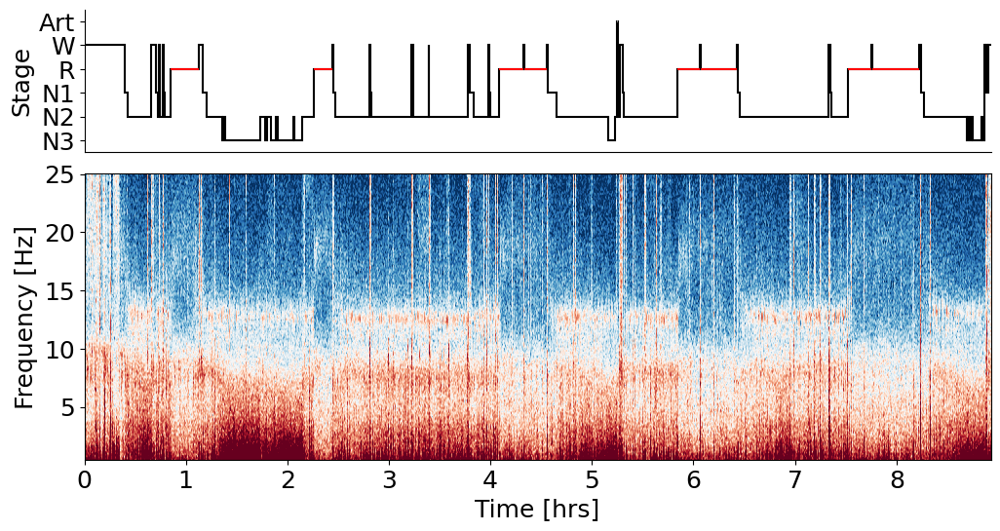

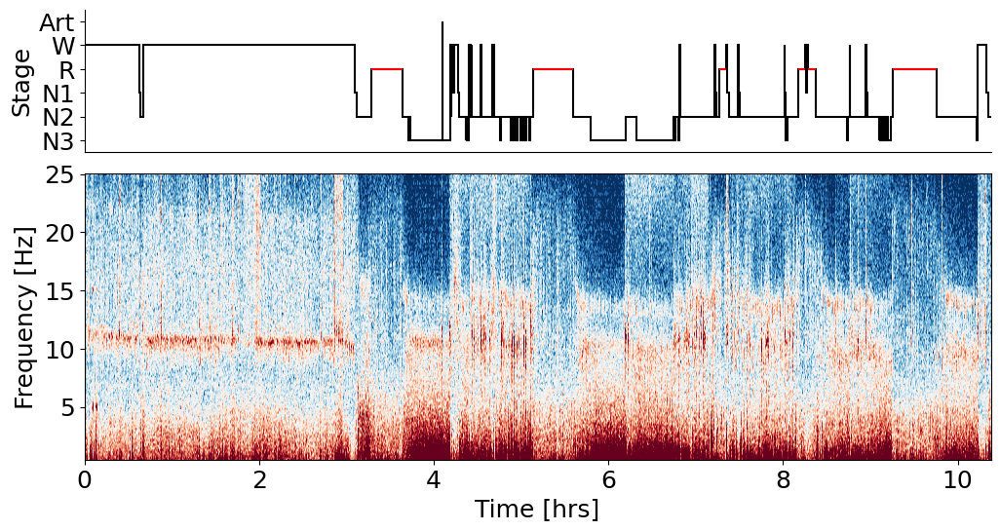

In [3]:
## 2. Process and save updated hypnogram files
# Iterate over all files and process them
for idx, file in enumerate(tqdm(files)):
    print(f'Detecting and labeling artifacts in file : {file}')
    # Load the data and hypnogram files
    raw = mne.io.read_raw(path + file + '-raw.fif.gz', preload=True) # type: ignore
    hypnogram = np.load(path + file + '-hypnogram.npy')
    # Get sampling frequency
    sf = raw.info['sfreq']
    # Get data
    data = raw.get_data() * 1e6
    # Unravel hypnogram to match data length
    hypnogram_unravel = yasa.hypno_upsample_to_data(hypno=hypnogram, sf_hypno=1/30, 
                                                    data=data, sf_data=sf)
    # Label artifacts based on Riemannian Potato clustering algorithm
    window = 4
    art, zscores = yasa.art_detect(data, sf=sf, window=window, hypno=hypnogram_unravel, 
                                   include=(1, 2, 3, 4), method='covar', threshold=3)
    sf_art = 1 / window
    
    # Upsample art to match data length
    art_up = yasa.hypno_upsample_to_data(art, sf_art, data, sf)

    # Add -1 to hypnogram where artifacts were detected
    hypno_with_art = hypnogram_unravel.copy()
    hypno_with_art[art_up] = -1

    # Plot and save the spectrogram with the updated hypnogram
    fig = yasa.plot_spectrogram(data[1, :], sf, hypno_with_art)
    fig.savefig(fig_path + file + '-hypno-artifacts.png', dpi=300)

    # Save the updated hypnogram
    np.save(path + file + '-hypnogram_with_art.npy', hypno_with_art)